Import scEGOT class and other libraries. We use os, glob, itertools, and pandas to read and reshape input data.

In [1]:
import os
import glob
import itertools

import pandas as pd
import anndata

from scegot import scEGOT

Set constants

In [2]:
DATASET_INPUT_ROOT_PATH = os.path.join(os.getcwd(), "dataset/input/")
RANDOM_STATE = 2023
PCA_N_COMPONENTS = 30
GMM_CLUSTER_NUMBERS = [1, 2, 4, 5, 5]
UMAP_N_NEIGHBORS = 1000
DAY_NAMES = ["day0", "day0.5", "day1", "day1.5", "day2"]

Read input files

Either `AnnData` or `DataFrame (CSV)` can be used.
- In the case of `AnnData`:
The name of the obs key containing the day information is passed as the `adata_day_key` argument when instantiating the `scEGOT` class.
- In the case of `DataFrame`:
One `DataFrame` must correspond to each day; prepare an array of DataFrames in the order of day.

In [3]:
# ----- In the case of AnnData -----
input_data = anndata.read_h5ad(
    f"{DATASET_INPUT_ROOT_PATH}scRNAseq_hPGCLC_induction_Saitou.h5ad"
)
print(input_data)
display(input_data.X)
display(input_data.obs)
display(input_data.var)

# ----- In the case of DataFrame (CSV) -----
# input_file_paths = sorted(glob.glob(f"{DATASET_INPUT_ROOT_PATH}usedataSmall/*.csv"))
# input_data = [
#     pd.read_csv(input_file_path, index_col=0) for input_file_path in input_file_paths
# ]
# print(f"number of days: {len(input_data)}")
# print("shape of each day's data:")
# for i, data in enumerate(input_data):
#     print(f"    {DAY_NAMES[i]}: {data.shape}")
# print("data example: ")
# input_data[0].head()

AnnData object with n_obs × n_vars = 11771 × 18922
    obs: 'sample', 'percent.mito', 'day', 'cluster_day'
    var: 'spliced', 'unspliced', 'mt', 'TF', 'gene_name'
    layers: 'X_raw', 'spliced', 'unspliced'


<11771x18922 sparse matrix of type '<class 'numpy.float32'>'
	with 94477374 stored elements in Compressed Sparse Row format>

,sample,percent.mito,day,cluster_day
iM.data_GTGGAAGGTCAATGGG-1,iM.data,0.056487,iM,day0
iM.data_TTCATGTCAACCCGCA-1,iM.data,0.216231,iM,day0
iM.data_GAGGGTATCCAGGACC-1,iM.data,0.076525,iM,day0
iM.data_AAGTCGTAGGCTTTCA-1,iM.data,0.080264,iM,day0
iM.data_ACCGTTCGTAACTTCG-1,iM.data,0.280788,iM,day0
...,...,...,...,...
d2b.data_AAGCCATAGGGCGAGA-1,d2b.data,4.811476,d2b,day2
d2b.data_CAACCAATCTTCCGTG-1,d2b.data,2.554428,d2b,day2
d2b.data_AGGCCACGTGAGTAGC-1,d2b.data,3.142146,d2b,day2
d2b.data_GATCAGTTCGAGTACT-1,d2b.data,4.287140,d2b,day2


,spliced,unspliced,mt,TF,gene_name
FAM3A,1,1,0,0,FAM3A
SLC25A1,1,1,0,0,SLC25A1
RBL1,1,1,0,0,RBL1
PPP2R1A,1,1,0,0,PPP2R1A
H3F3B,1,1,0,0,H3F3B
...,...,...,...,...,...
OR2W5,1,0,0,0,OR2W5
ODF4,1,1,0,0,ODF4
CRP,1,0,0,0,CRP
KRTAP4-9,1,0,0,0,KRTAP4-9


In [4]:
tf_gene_names = (
    pd.read_csv(
        f"{DATASET_INPUT_ROOT_PATH}TF_genes/TFgenes_name.csv", header=None, index_col=0
    )
    .T["cell"]
    .values
)
tf_gene_names

array(['ZBTB8B', 'GSX2', 'TBX2', ..., 'NME2', 'ZNF488', 'ZNF280B'],
      dtype=object)

# Tutorial

Create scEGOT instance.

You must pass values for the `adata_day_key` argument when using AnnData and for the `day_names` argument when using an array of DataFrames.
`adata_day_key` is the key of the day in AnnData.obs, and `day_names` is an array containing the names of the days in each DataFrames.

In [5]:
# ----- In the case of AnnData -----
scegot = scEGOT(
    input_data,
    verbose=True,  # default=True
    adata_day_key="cluster_day",
)

# ----- In the case of DataFrame (CSV) -----
# scegot = scEGOT(
#     input_data,
#     PCA_N_COMPONENTS,
#     GMM_CLUSTER_NUMBERS,
#     verbose=True,  # default=True
#     day_names=DAY_NAMES, # uncomment this line if you use an array of DataFrames
# )

Processing AnnData...


## Preprocess:

Preprocess in the following order.

RECODE -> UMI normalize -> log1p normalize -> select variable genes -> PCA

You can also apply UMAP by calling `apply_umap()` after `preprocess()`. In the tutorial, UMAP is applied after GMM is applied.

In [6]:
%%time
X, pca_model = scegot.preprocess(
    PCA_N_COMPONENTS,
    recode_params={},
    umi_target_sum=1e5,
    pca_random_state=RANDOM_STATE,
    pca_other_params={},
    apply_recode=True,
    apply_normalization_log1p=True,
    apply_normalization_umi=True,
    select_genes=True,
    n_select_genes=2000,
)

Applying RECODE...
start RECODE for scRNA-seq data
end RECODE for scRNA-seq
log: {'seq_target': 'RNA', '#significant genes': 15820, '#non-significant genes': 2582, '#silent genes': 65, 'ell': 288, 'Elapsed time': '0h 0m 26s 765ms', 'stat_learning': True, '#test_data': 2354}
Applying UMI normalization...
Applying log1p normalization...
Applying PCA...
	sum of explained_variance_ratio = 84.9264145902248
CPU times: user 2min 37s, sys: 14 s, total: 2min 51s
Wall time: 42.7 s


## Apply GMM:

Apply GMM and visualize the results in each case of PCA and UMAP. To switch between PCA and UMAP displays, specify the mode argument to the plotting function.

In [7]:
%%time
gmm_models, gmm_labels = scegot.fit_predict_gmm(
    n_components_list=GMM_CLUSTER_NUMBERS,
    covariance_type="full",
    max_iter=2000,
    n_init=10,
    random_state=RANDOM_STATE,
    gmm_other_params={},
)

Fitting GMM models with each day's data and predicting labels for them...


100%|█████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.63s/it]

CPU times: user 20min 13s, sys: 1min 10s, total: 21min 23s
Wall time: 2min 48s


Visualization in PCA

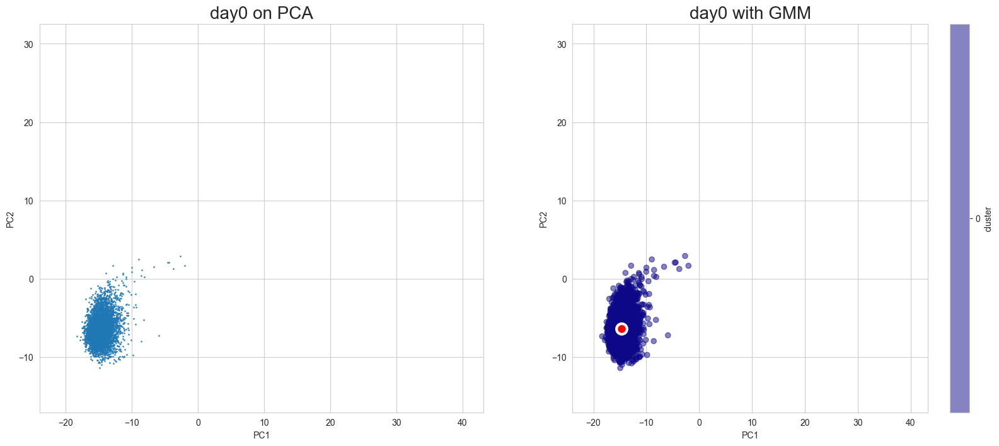

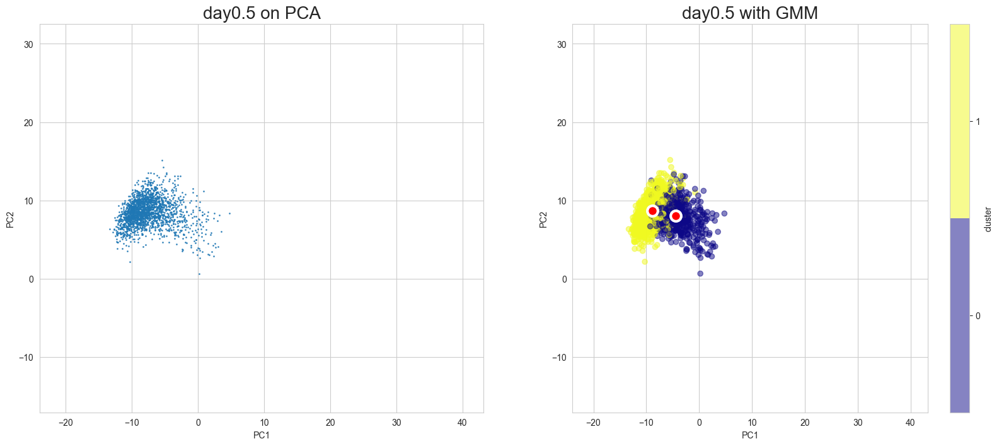

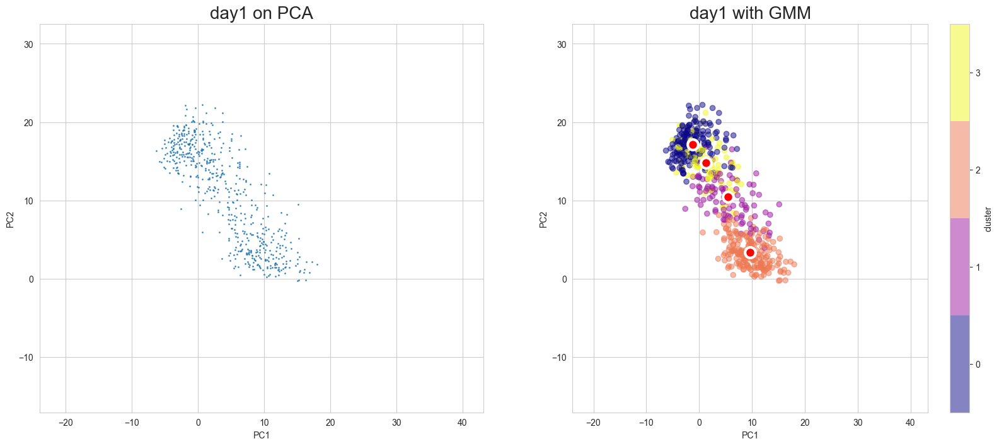

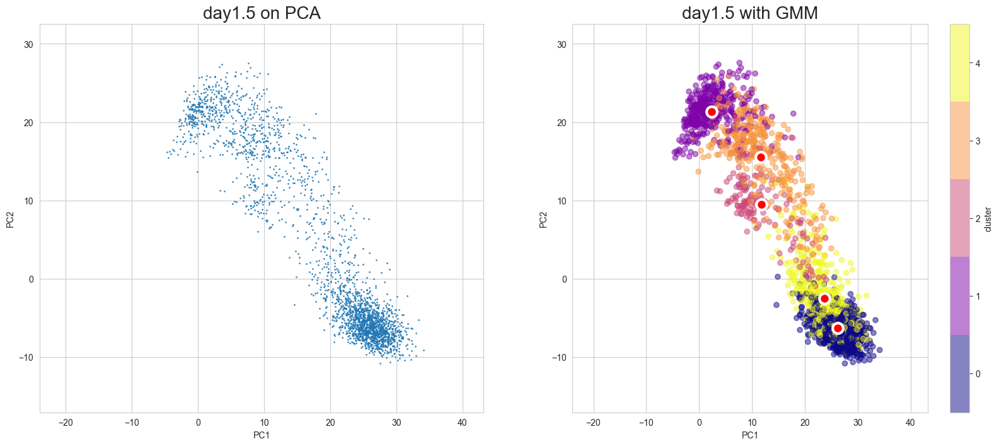

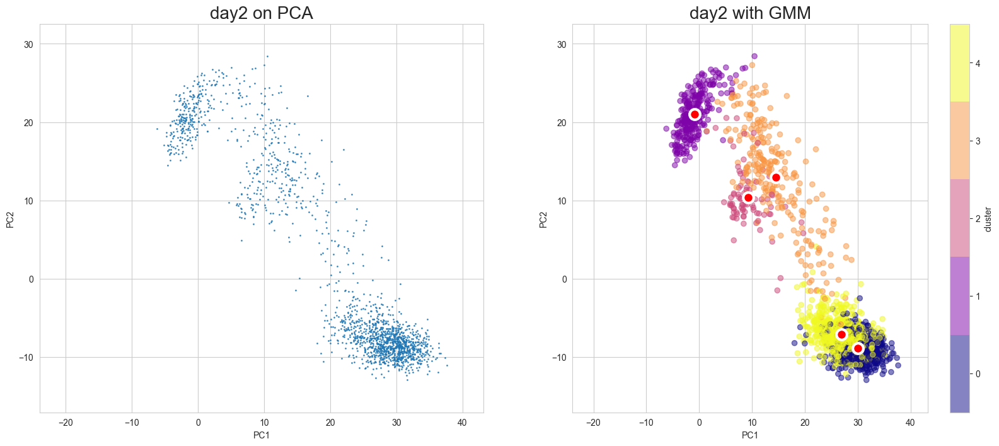

In [8]:
scegot.plot_gmm_predictions(
    mode="pca",
    plot_gmm_means=True,
    figure_titles_without_gmm=[f"{name} on PCA" for name in DAY_NAMES],
    figure_titles_with_gmm=[f"{name} with GMM" for name in DAY_NAMES],
    cmap="plasma",
    # save=True,
    # save_paths=[f"./gmm_preds_{day_name}.png" for day_name in DAY_NAMES]
)

Apply UMAP

In [ ]:
%%time
X_umap, umap_model = scegot.apply_umap(
    UMAP_N_NEIGHBORS,
    n_components=2,
    random_state=RANDOM_STATE,
    min_dist=0.8,
    umap_other_params={},
)

Visualization in UMAP

In [ ]:
scegot.plot_gmm_predictions(
    mode="umap",
    plot_gmm_means=True,
    figure_titles_without_gmm=[f"{name} on UMAP" for name in DAY_NAMES],
    figure_titles_with_gmm=[f"{name} with GMM" for name in DAY_NAMES],
    cmap="plasma",
    # save=True,
    # save_paths=[f"./gmm_preds_{day_name}.png" for day_name in DAY_NAMES]
)

## Animation of interpolated distribution:

In [ ]:
scegot.animatie_interpolated_distribution(
    cmap="gnuplot2",
    interpolate_interval=11,
    # save=True,
    # save_path="./cell_state_video.gif",
)

## Cell State Graph:

There are two functions for visualizing cell state graphs, one is `plot_cell_state_graph()` and the other is `plot_simple_cell_state_graph()`. Both can visualize PCA and UMAP.

Before plotting the graph, call `make_cell_state_graph()` to create a graph object. At that time, cluster names must be specified as an array. Of course, you can create them manually, or there is a function called `generate_cluster_names_with_day(`) that automatically generates cluster names for you.

Since cluster names are not maintained in the scEGOT class, an array of cluster names must be passed to the function that draws the cluster names each time.

There will be other occasions where cluster names are passed in the `pathway` and `cell velocity` sections, but it is not necessary for the cluster names in those cases to match the cluster names used in this section. Therefore, the cluster name can be changed flexibly.

In [ ]:
cluster_names = scegot.generate_cluster_names_with_day()
cluster_names

### In the case of  `plot_cell_state_graph()`

* Gene information is displayed in the graph.

PCA ver.

In [ ]:
G = scegot.make_cell_state_graph(
    cluster_names,
    mode="pca",
    threshold=0.1,
)
scegot.plot_cell_state_graph(
    G,
    cluster_names,
    tf_gene_names=tf_gene_names,
    tf_gene_pick_num=5,
    # save=True,
    # save_path="./cell_state_graph_pca.png"
)

UMAP ver.

In [ ]:
G_umap = scegot.make_cell_state_graph(
    cluster_names,
    mode="umap",
    threshold=0.1,
)
scegot.plot_cell_state_graph(
    G_umap,
    cluster_names,
    tf_gene_names=tf_gene_names,
    tf_gene_pick_num=5,
    # save=True,
    # save_path="./cell_state_graph_umap.png"
)

### In the case of `plot_simple_cell_state_graph()`

* The shape of the graph can be changed by changing the layout argument.
* When `layout="hierarchy"` and `order="weight"`, the nodes are sorted in order of node weight.
  * If the order argument is not specified, the nodes are sorted in the order of their gmm labels.

PCA ver.

In [ ]:
scegot.plot_simple_cell_state_graph(
    G,
    layout="normal",
    # save=True,
    # save_path="./simple_cell_state_graph_pca.png"
)

UMAP ver.

In [ ]:
scegot.plot_simple_cell_state_graph(
    G_umap,
    layout="normal",
    # save=True,
    # save_path="./simple_cell_state_graph_umap.png"
)

layout="hierarchy"

In [ ]:
scegot.plot_simple_cell_state_graph(
    G,
    layout="hierarchy",
    order="weight",
    # save=True,
    # save_path="./simple_cell_state_graph_hierarchy.png"
)

## Fold Change:

You can see the fold change between the two clusters.

In [ ]:
cluster1 = "day0.5-0"
cluster2 = "day0.5-1"
scegot.plot_fold_change(
    cluster_names,
    cluster1,
    cluster2,
    tf_gene_names=tf_gene_names,
    threshold=0.8,
    # save=True,
    # save_path="./fold_change.png"
)

## Pathway Analysis:

Visualize the transition of expression levels of `selected_genes` in the clusters specified by `pathway_names`.

In [ ]:
pathway_names = [
    "day0-0",
    "day0.5-1",
    "day1-1",
    "day1.5-4",
    "day2-2",
]
scegot.plot_pathway_mean_var(
    cluster_names,
    pathway_names,
    tf_gene_names=tf_gene_names,
    threshold=1.0,
    # save=True,
    # save_path="./pathway_mean_var.png"
)

In [ ]:
pathway_names = [
    "day0-0",
    "day0.5-1",
    "day1-1",
    "day1.5-4",
    "day2-2",
]
selected_genes = ["NANOG", "SOX17", "TFAP2C", "NKX1-2"]
scegot.plot_pathway_gene_expressions(
    cluster_names,
    pathway_names,
    selected_genes,
    tf_gene_names=tf_gene_names,
    # save=True,
    # save_path="./pathway_gene_expressions.png"
)

## Plot gene expression:

You can also plot only the features of a single gene.

### 2D

PCA ver.

In [ ]:
gene_name = "NKX1-2"
scegot.plot_pathway_single_gene_2d(
    gene_name,
    mode="pca",
    # save=True,
    # save_path="./pathway_single_gene_2d_pca.png"
)

UMAP ver.

In [ ]:
gene_name = "NKX1-2"
scegot.plot_pathway_single_gene_2d(
    gene_name,
    mode="umap",
    # save=True,
    # save_path="./pathway_single_gene_2d_umap.png"
)

### 3D

In [ ]:
gene_name = "NKX1-2"
scegot.plot_pathway_single_gene_3d(
    gene_name,
    # save=True,
    # save_path="./pathway_single_gene_3d.html"
)

## Interpolation:

### Make interpolation distribution

For each of PCA and UMAP, interpolated and correct data can be compared. Also, source and target can be toggled on and off.

PCA ver.

In [ ]:
scegot.plot_true_and_interpolation_distributions(
    interpolate_index=2,
    mode="pca",
    n_samples=1000,
    t=0.5,
    plot_source_and_target=True,
    alpha_true=0.5,
    # save=True,
    # save_path="./true_and_interpolation_distributions_pca.png"
)

UMAP ver.

In [ ]:
scegot.plot_true_and_interpolation_distributions(
    interpolate_index=2,
    mode="umap",
    n_samples=500,
    t=0.5,
    plot_source_and_target=False,
    alpha_true=0.5,
    # save=True,
    # save_path="./true_and_interpolation_distributions_pca.png"
)

### Interpolated animation of gene expression

PCA ver.

In [30]:
target_gene = "NKX1-2"
scegot.animate_interpolation(
    target_gene,
    mode="pca",
    interpolate_interval=11,
    n_samples=5000,
    cmap="gnuplot2",
    # save=True,
    # save_path="./interpolate_video_pca.gif"
)

Interpolating between day0 and day0.5...


100%|██████████| 11/11 [00:00<00:00, 14.93it/s]


Interpolating between day0.5 and day1...


100%|██████████| 10/10 [00:00<00:00, 12.68it/s]


Interpolating between day1 and day1.5...


100%|██████████| 10/10 [00:01<00:00,  9.00it/s]


Interpolating between day1.5 and day2...


100%|██████████| 10/10 [00:01<00:00,  6.85it/s]


Creating animation...


UMAP ver.

Note that animation in umap space is time consuming due to the high computational cost of projecting into umap space.

In [31]:
%%time
target_gene = "NKX1-2"
scegot.animate_interpolation(
    target_gene,
    mode="umap",
    interpolate_interval=11,
    n_samples=1000,
    cmap="gnuplot2",
    # save=True,
    # save_path="./interpolate_video_umap.gif"
)

Interpolating between day0 and day0.5...


100%|██████████| 11/11 [05:18<00:00, 29.00s/it]


Interpolating between day0.5 and day1...


100%|██████████| 10/10 [05:06<00:00, 30.66s/it]


Interpolating between day1 and day1.5...


100%|██████████| 10/10 [05:08<00:00, 30.87s/it]


Interpolating between day1.5 and day2...


100%|██████████| 10/10 [05:19<00:00, 31.94s/it]


Creating animation...


CPU times: user 21min 31s, sys: 22.8 s, total: 21min 54s
Wall time: 20min 58s


## Cell velocity:

### Plotting cell velocity

After the velocity is calculated using `calculate_cell_velocities()`, visualize it with `plot_cell_velocity()`. Both PCA and UMAP are supported.

PCA ver.

In [ ]:
velocities = scegot.calculate_cell_velocities(
    mode="pca",
)
scegot.plot_cell_velocity(
    velocities,
    mode="pca",
    cmap="gnuplot2",
    # save=True,
    # save_path="./cell_velocity_pca.png"
)

UMAP ver.

In [ ]:
%%time
velocities_umap = scegot.calculate_cell_velocities(
    mode="umap",
)
scegot.plot_cell_velocity(
    velocities_umap,
    mode="umap",
    cmap="gnuplot2",
    # save=True,
    # save_path="./cell_velocity_umap.png"
)

### Interpolation of cell velocity

You can color the clusters and / or the streams.

PCA ver.

In [ ]:
scegot.plot_interpolation_of_cell_velocity(
    velocities,
    mode="pca",
    color_streams=False,
    color_points="gmm",
    cluster_names=list(itertools.chain.from_iterable(cluster_names)),
    cmap="tab20",
    # save=True,
    # save_path="./cell_velocity_interpolation_pca_point.png"
)

In [ ]:
scegot.plot_interpolation_of_cell_velocity(
    velocities,
    mode="pca",
    color_streams=True,
    color_points=None,
    cluster_names=None,
    cmap="gnuplot2",
    # save=True,
    # save_path="./cell_velocity_interpolation_pca_stream.png"
)

UMAP ver.

In [ ]:
scegot.plot_interpolation_of_cell_velocity(
    velocities_umap,
    mode="umap",
    color_streams=False,
    color_points="gmm",
    cluster_names=list(itertools.chain.from_iterable(cluster_names)),
    cmap="tab20",
    # save=True,
    # save_path="./cell_velocity_interpolation_umap_point.png"
)

In [ ]:
scegot.plot_interpolation_of_cell_velocity(
    velocities_umap,
    mode="umap",
    color_streams=True,
    color_points=None,
    cluster_names=None,
    cmap="gnuplot2",
    # save=True,
    # save_path="./cell_velocity_interpolation_umap_stream.png"
)

## Gene regulatory network:

You can infer and visualize the Gene regulatory network between genes specified in `selected_genes`.

In [ ]:
%%time
GRNs, ridgeCVs = scegot.calculate_grns(
    selected_clusters=None,
    alpha_range=(-2, 2),
    cv=3,
    ridge_cv_fit_intercept=False,
    ridge_fit_intercept=False,
)

In [ ]:
selected_genes = ["TFAP2C", "SOX17", "PRDM1", "NKX1-2"]
scegot.plot_grn_graph(
    GRNs,
    ridgeCVs,
    selected_genes,
    threshold=0.01,
    # save=True,
    # save_paths=[f"./grn_{day_name}.png" for day_name in DAY_NAMES],
    # save_format="png"
)

By passing an array of cluster names to `selected_clusters`, you can specify the clusters to be used in the GRN calculation.

In [ ]:
%%time
selected_clusters = [[0, 0], [1, 0], [2, 0], [3, 0]]
GRNs_cluster, ridgeCVs_cluster = scegot.calculate_grns(
    selected_clusters=selected_clusters,
    alpha_range=(-2, 2),
    cv=3,
    ridge_cv_fit_intercept=False,
    ridge_fit_intercept=False,
)

In [ ]:
selected_genes = ["TFAP2C", "SOX17", "PRDM1", "NKX1-2"]
scegot.plot_grn_graph(
    GRNs_cluster,
    ridgeCVs_cluster,
    selected_genes,
    threshold=0.01,
    # save=True,
    # save_paths=[f"grn_selected_clusters_{day_name}" for day_name in DAY_NAMES],
    # save_format="png"
)

## Reconstruction of the Waddington Landscape:

Both PCA and UMAP are supported.

In [ ]:
%%time
Wpotential, F_all = scegot.calculate_waddington_potential(
    n_neighbors=100,
    knn_other_params={},
)

Plot the Waddington potential in 3 dimensions. If `gene_name` is specified, the graph is colored by the expression level of the gene, and if `gene_name` is None, the graph is colored by the Waddington potential.

PCA ver.

In [ ]:
scegot.plot_waddington_potential(
    Wpotential,
    mode="pca",
    gene_name=None,
    # save=True,
    # save_path="./waddington_potential_pca_potential.html"
)

In [ ]:
gene_name = "NKX1-2"
scegot.plot_waddington_potential(
    Wpotential,
    mode="pca",
    gene_name=gene_name,
    # save=True,
    # save_path="./waddington_potential_pca_expression.html"
)

UMAP ver.

In [ ]:
scegot.plot_waddington_potential(
    Wpotential,
    mode="umap",
    gene_name=None,
    # save=True,
    # save_path="./waddington_potential_umap_potential.html"
)

In [ ]:
gene_name = "NKX1-2"
scegot.plot_waddington_potential(
    Wpotential,
    mode="umap",
    gene_name=gene_name,
    # save=True,
    # save_path="./waddington_potential_umap_expression.html"
)

You can also display a landscape instead of a plot of points.

PCA ver.

In [ ]:
scegot.plot_waddington_potential_surface(
    Wpotential,
    mode="pca",
    # save=True,
    # save_path="./waddington_potential_surface_pca.html"
)

UMAP ver.

In [ ]:
scegot.plot_waddington_potential_surface(
    Wpotential,
    mode="umap",
    # save=True,
    # save_path="./waddington_potential_surface_umap.html"
)